In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install opencv-python

In [ ]:
!pip install tensorflow

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import PIL
import plotly
import plotly.express as px
import gc

from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten,Input,ZeroPadding2D,BatchNormalization,Activation
from tensorflow.keras.metrics import BinaryAccuracy, Precision, Recall
#from tensorflow.keras.layers.experimental import preprocessing

from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings("ignore")

In [ ]:
path = '/content/drive/MyDrive/Diabetic/gaussian_filtered_images/gaussian_filtered_images'

In [ ]:
No_DR_Img = os.listdir(path + '/No_DR/')
Mild_Img = os.listdir(path + '/Mild/')
Moderate_Img = os.listdir(path + '/Moderate/')
Proliferate_DR_Img = os.listdir(path + '/Proliferate_DR/')
Severe_Img = os.listdir(path + '/Severe/')

In [ ]:
print("No_DR_Img has {} images".format(len(No_DR_Img)))
print("Mild_Img has {} images".format(len(Mild_Img)))
print("Moderate_Img has {} images".format(len(Moderate_Img)))
print("Proliferate_DR_Img has {} images".format(len(Proliferate_DR_Img)))
print("Severe_Img has {} images".format(len(Severe_Img)))

No_DR_Img has 1809 images
Mild_Img has 370 images
Moderate_Img has 1009 images
Proliferate_DR_Img has 301 images
Severe_Img has 193 images


In [ ]:
total_images = len(No_DR_Img) + len(Mild_Img) + len(Moderate_Img) + len(Proliferate_DR_Img) + len(Severe_Img)
print("Total number of images: {}".format(total_images))

Total number of images: 3682


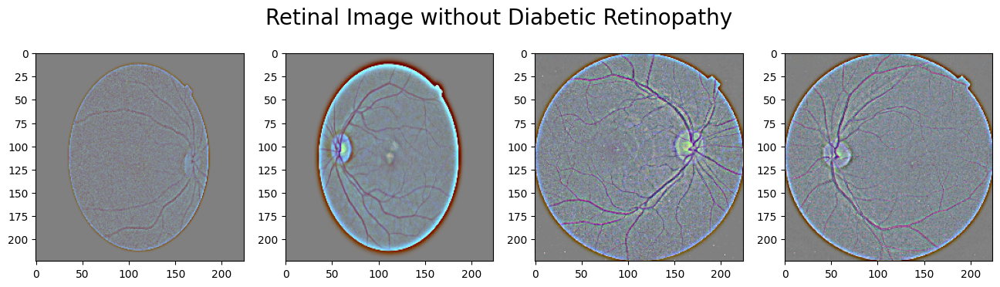

In [ ]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/No_DR/'+ No_DR_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image without Diabetic Retinopathy",fontsize=20)
plt.show()

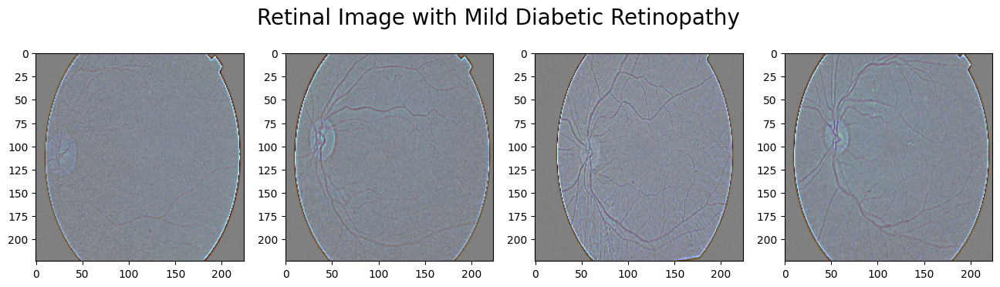

In [ ]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Mild/'+ Mild_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Mild Diabetic Retinopathy",fontsize=20)
plt.show()

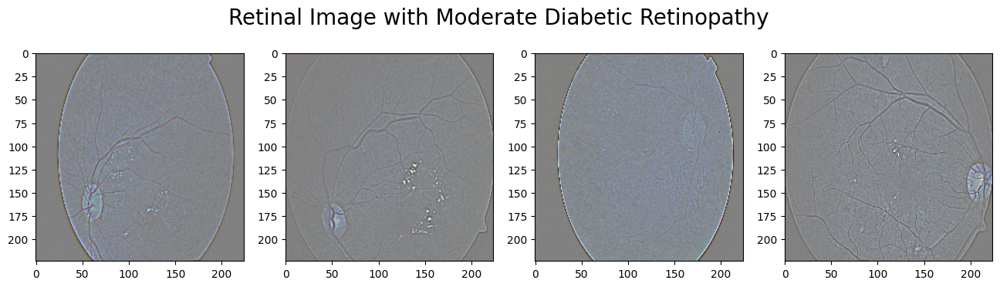

In [ ]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Moderate/'+ Moderate_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Moderate Diabetic Retinopathy",fontsize=20)
plt.show()

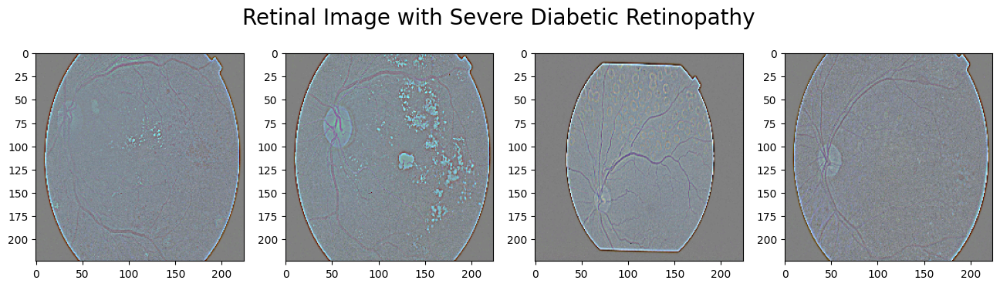

In [ ]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Severe/'+ Severe_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Severe Diabetic Retinopathy",fontsize=20)
plt.show()

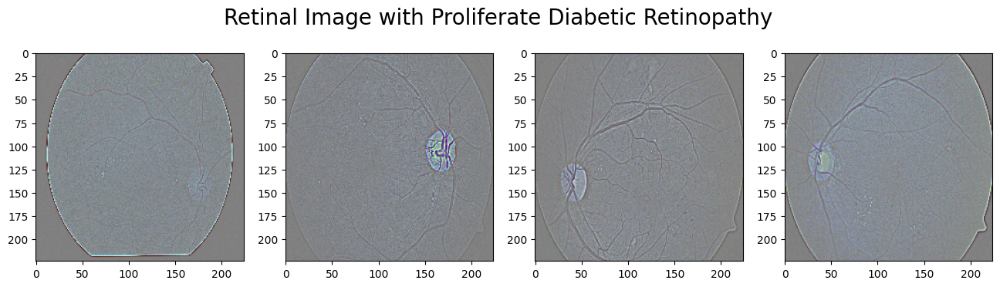

In [ ]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Proliferate_DR/'+ Proliferate_DR_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Proliferate Diabetic Retinopathy",fontsize=20)
plt.show()

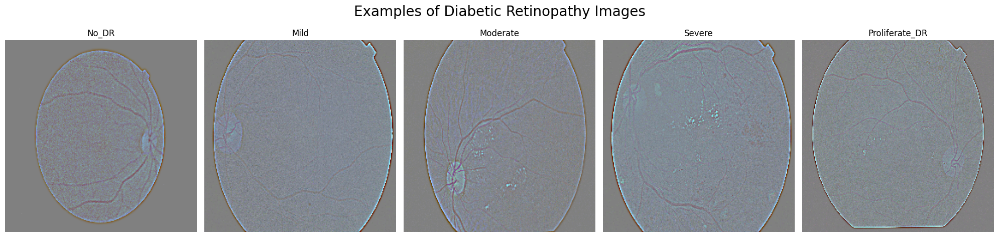

In [ ]:
fig = plt.figure(figsize=(20, 5))

# No_DR
plt.subplot(1, 5, 1)
img_no_dr = cv2.imread(path + '/No_DR/' + No_DR_Img[0])
plt.imshow(img_no_dr)
plt.title('No_DR')
plt.axis('off')

# Mild
plt.subplot(1, 5, 2)
img_mild = cv2.imread(path + '/Mild/' + Mild_Img[0])
plt.imshow(img_mild)
plt.title('Mild')
plt.axis('off')

# Moderate
plt.subplot(1, 5, 3)
img_moderate = cv2.imread(path + '/Moderate/' + Moderate_Img[0])
plt.imshow(img_moderate)
plt.title('Moderate')
plt.axis('off')

# Severe
plt.subplot(1, 5, 4)
img_severe = cv2.imread(path + '/Severe/' + Severe_Img[0])
plt.imshow(img_severe)
plt.title('Severe')
plt.axis('off')

# Proliferate_DR
plt.subplot(1, 5, 5)
img_proliferate = cv2.imread(path + '/Proliferate_DR/' + Proliferate_DR_Img[0])
plt.imshow(img_proliferate)
plt.title('Proliferate_DR')
plt.axis('off')

plt.suptitle("Examples of Diabetic Retinopathy Images", fontsize=20)
plt.tight_layout()
plt.show()

In [ ]:
Classes = {'No_DR':0, 'Mild':1, 'Moderate':2, 'Severe':3, 'Proliferate_DR':4}


In [ ]:
gc.collect()


0

In [ ]:
#Normalizing pixel values
X = []
y = []
desired_size = (128, 128)

for i in Classes:
    folder_path = path + '/' + i  # Added '/' here
    for j in os.listdir(folder_path):
        img = cv2.imread(folder_path+'/'+j)
        img = cv2.resize(img, desired_size)
        # normalize values
        img = img / 255  #-->Apply normalization because we want pixel values to be scaled to the range 0-1
        X.append(img)
        y.append(Classes[i])

In [ ]:
X = np.array(X)
y = np.array(y)

X.shape, y.shape

((3682, 128, 128, 3), (3682,))

# **Data Augmentation**

In [ ]:
#Class division

Class_series=pd.Series(y)
lis=["No_DR","Mild","Moderate","Severe","Proliferate_DR"]
DR_or_not = Class_series.value_counts().tolist()
values = [DR_or_not[0], DR_or_not[1], DR_or_not[2], DR_or_not[3], DR_or_not[4]]
fig = px.pie(values=Class_series.value_counts(), names=lis , width=800, height=400, color_discrete_sequence=["skyblue","black","pink","purple","blue"]
             ,title="percentage among the different Severities of DR")
fig.show()

In [ ]:
!pip install imbalanced-learn

In [ ]:
from imblearn.over_sampling import SMOTE
# Using SMOTE to oversample the minority class(Edema) to avoid class imbalance
sm = SMOTE(random_state = 2)
X, y = sm.fit_resample(X.reshape(X.shape[0], -1), y.ravel())

In [ ]:
#Class division

Class_series=pd.Series(y)
lis=["No_DR","Mild","Moderate","Severe","Proliferate_DR"]
DR_or_not = Class_series.value_counts().tolist()
values = [DR_or_not[0], DR_or_not[1], DR_or_not[2], DR_or_not[3], DR_or_not[4]]
fig = px.pie(values=Class_series.value_counts(), names=lis , width=800, height=400, color_discrete_sequence=["skyblue","black","pink","purple","blue"]
             ,title="percentage among the different Severities of DR")
fig.show()

In [ ]:
import pandas as pd
Class_series = pd.Series(y)
print("Number of images per class:")
for i, class_name in enumerate(lis):
    count = Class_series.value_counts().get(i, 0)
    print(f"{class_name}: {count}")

Number of images per class:
No_DR: 1809
Mild: 1809
Moderate: 1809
Severe: 1809
Proliferate_DR: 1809


In [ ]:
X[0].shape

(49152,)

In [ ]:
X = X.reshape(X.shape[0], 128, 128, 3)


In [ ]:
X[0].shape


(128, 128, 3)

In [ ]:
gc.collect()


610

# **Data Split**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=32, stratify=y)
#used stratify to balance the number of examples for each class

In [ ]:
X_train.shape

(7236, 128, 128, 3)

In [ ]:
X_test.shape


(1809, 128, 128, 3)

In [ ]:
X_train.size


355663872

In [ ]:
X_test.size


88915968

In [ ]:
# Reshape the arrays
X_train = X_train.reshape((-1, 128, 128, 3))
X_test = X_test.reshape((-1, 128, 128, 3))

# **DenseNet121 Model Training**

In [ ]:
from tensorflow.keras.applications.densenet import DenseNet121

In [ ]:
model = DenseNet121(input_shape=(128, 128, 3),weights='imagenet',include_top=False)


29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
model.trainable = True

set_trainable = False

for layer in model.layers:
    if layer.name == 'conv5_block16_0_bn':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [ ]:
for layer in model.layers[:]:
    if ('bn' in layer.name):
        trainable = False

In [ ]:
from tensorflow.keras.layers import Dense,Flatten,Input,Dropout,Activation,BatchNormalization,Lambda

In [ ]:
x = Flatten()(model.output)
x = tf.keras.layers.Dense(128,activation='relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
prediction = Dense(5,activation='softmax')(x)

In [ ]:
from tensorflow.keras.models import Model


In [ ]:
model = Model(inputs=model.input, outputs=prediction)


In [ ]:
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 134, 134,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 64, 64,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 64, 64,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 64, 64,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 66, 66,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 32, 32,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 32, 32,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 32, 32,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 32, 32,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 32, 32,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 32, 32,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 32, 32,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 32, 32,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 32, 32,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 32, 32,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 32, 32,    │     12,288 │ conv2_block2_0_r

 Total params: 9,135,429 (34.85 MB)

 Trainable params: 2,266,053 (8.64 MB)

 Non-trainable params: 6,869,376 (26.20 MB)

In [ ]:
gc.collect()


1929

In [ ]:
from keras.callbacks import ModelCheckpoint,EarlyStopping

#Early Stopping

es = EarlyStopping(monitor='val_accuracy', min_delta = 0.005, patience=25, verbose=1, mode='auto')

#Model Check Point

mc = ModelCheckpoint(monitor='val_accuracy', filepath = 'densenet121_model.h5', verbose=1, save_best_only = True, mode='auto')

cd = [es,mc]

In [ ]:
adam = keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss='sparse_categorical_crossentropy',
              optimizer = adam,
              metrics=['accuracy']
)

In [ ]:
gc.collect()


0

In [ ]:
history = model.fit(x=X_train, y=y_train,
          validation_data=(X_test, y_test),
          epochs=60,
          callbacks=cd,
          batch_size=64,
          shuffle=True)


print(history.history.keys())

Epoch 1/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - accuracy: 0.4137 - loss: 2.0903
Epoch 1: val_accuracy improved from -inf to 0.57933, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 63s 308ms/step - accuracy: 0.4142 - loss: 2.0843 - val_accuracy: 0.5793 - val_loss: 1.0704
Epoch 2/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5353 - loss: 1.0439
Epoch 2: val_accuracy improved from 0.57933 to 0.65451, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.5358 - loss: 1.0434 - val_accuracy: 0.6545 - val_loss: 0.8433
Epoch 3/60
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.5917 - loss: 0.9284
Epoch 3: val_accuracy improved from 0.65451 to 0.69320, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.5919 - loss: 0.9281 - val_accuracy: 0.6932 - val_loss: 0.7989
Epoch 4/60
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6101 - loss: 0.9025
Epoch 4: val_accuracy improved from 0.69320 to 0.73908, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.6104 - loss: 0.9015 - val_accuracy: 0.7391 - val_loss: 0.6618
Epoch 5/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6829 - loss: 0.7762
Epoch 5: val_accuracy improved from 0.73908 to 0.79270, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.6833 - loss: 0.7745 - val_accuracy: 0.7927 - val_loss: 0.5497
Epoch 6/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.6419 - loss: 0.8172
Epoch 6: val_accuracy improved from 0.79270 to 0.79934, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.6429 - loss: 0.8152 - val_accuracy: 0.7993 - val_loss: 0.5207
Epoch 7/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7284 - loss: 0.6258
Epoch 7: val_accuracy improved from 0.79934 to 0.82477, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.7286 - loss: 0.6256 - val_accuracy: 0.8248 - val_loss: 0.5009
Epoch 8/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7675 - loss: 0.5481
Epoch 8: val_accuracy improved from 0.82477 to 0.84190, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.7677 - loss: 0.5480 - val_accuracy: 0.8419 - val_loss: 0.4126
Epoch 9/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7766 - loss: 0.5040
Epoch 9: val_accuracy improved from 0.84190 to 0.84632, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.7770 - loss: 0.5038 - val_accuracy: 0.8463 - val_loss: 0.4349
Epoch 10/60
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8022 - loss: 0.4674
Epoch 10: val_accuracy improved from 0.84632 to 0.85627, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - accuracy: 0.8022 - loss: 0.4674 - val_accuracy: 0.8563 - val_loss: 0.4097
Epoch 11/60
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7755 - loss: 0.5428
Epoch 11: val_accuracy improved from 0.85627 to 0.88999, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.7756 - loss: 0.5425 - val_accuracy: 0.8900 - val_loss: 0.3445
Epoch 12/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8097 - loss: 0.4681
Epoch 12: val_accuracy did not improve from 0.88999
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.8097 - loss: 0.4674 - val_accuracy: 0.8579 - val_loss: 0.4038
Epoch 13/60
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.7766 - loss: 0.4986
Epoch 13: val_accuracy did not improve from 0.88999
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.7770 - loss: 0.4978 - val_accuracy: 0.8856 - val_loss: 0.3391
Epoch 14/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8090 - loss: 0.4151
Epoch 14: val_accuracy did not improve from 0.88999
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.8092 - loss: 0.4150 - val_accuracy: 0.8485 - val_loss: 0.5195
Epoch 15/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8043 - loss: 0.4569
Epoch 15: val_accura

114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.8070 - loss: 0.4700 - val_accuracy: 0.8917 - val_loss: 0.3694
Epoch 17/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8448 - loss: 0.3632
Epoch 17: val_accuracy improved from 0.89165 to 0.92150, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.8448 - loss: 0.3631 - val_accuracy: 0.9215 - val_loss: 0.2885
Epoch 18/60
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8634 - loss: 0.3122
Epoch 18: val_accuracy did not improve from 0.92150
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.8632 - loss: 0.3122 - val_accuracy: 0.8983 - val_loss: 0.3641
Epoch 19/60
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8622 - loss: 0.3421
Epoch 19: val_accuracy did not improve from 0.92150
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8622 - loss: 0.3418 - val_accuracy: 0.8944 - val_loss: 0.3768
Epoch 20/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8706 - loss: 0.3050
Epoch 20: val_accuracy did not improve from 0.92150
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8706 - loss: 0.3050 - val_accuracy: 0.9093 - val_loss: 0.3091
Epoch 21/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8781 - loss: 0.2784
Epoch 21: val_accura

114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.9028 - loss: 0.2128 - val_accuracy: 0.9243 - val_loss: 0.3071
Epoch 25/60
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8516 - loss: 0.4011
Epoch 25: val_accuracy did not improve from 0.92427
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.8520 - loss: 0.3998 - val_accuracy: 0.9038 - val_loss: 0.3329
Epoch 26/60
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9137 - loss: 0.2276
Epoch 26: val_accuracy did not improve from 0.92427
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.9138 - loss: 0.2276 - val_accuracy: 0.9011 - val_loss: 0.4272
Epoch 27/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9199 - loss: 0.2184
Epoch 27: val_accuracy improved from 0.92427 to 0.92924, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.9199 - loss: 0.2185 - val_accuracy: 0.9292 - val_loss: 0.2897
Epoch 28/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8956 - loss: 0.3097
Epoch 28: val_accuracy did not improve from 0.92924
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8957 - loss: 0.3093 - val_accuracy: 0.9221 - val_loss: 0.3565
Epoch 29/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9311 - loss: 0.2000
Epoch 29: val_accuracy did not improve from 0.92924
114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.9311 - loss: 0.1997 - val_accuracy: 0.9176 - val_loss: 0.4099
Epoch 30/60
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9369 - loss: 0.1875
Epoch 30: val_accuracy improved from 0.92924 to 0.93201, saving model to densenet121_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.9369 - loss: 0.1873 - val_accuracy: 0.9320 - val_loss: 0.3458
Epoch 31/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8617 - loss: 0.3396
Epoch 31: val_accuracy did not improve from 0.93201
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.8619 - loss: 0.3391 - val_accuracy: 0.9182 - val_loss: 0.4025
Epoch 32/60
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.9334 - loss: 0.1886
Epoch 32: val_accuracy did not improve from 0.93201
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.9333 - loss: 0.1885 - val_accuracy: 0.9281 - val_loss: 0.3261
Epoch 33/60
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8897 - loss: 0.2846
Epoch 33: val_accuracy did not improve from 0.93201
114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.8898 - loss: 0.2843 - val_accuracy: 0.9044 - val_loss: 0.4721
Epoch 34/60
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - accuracy: 0.8738 - loss: 0.3256
Epoch 34: val_accura

In [ ]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

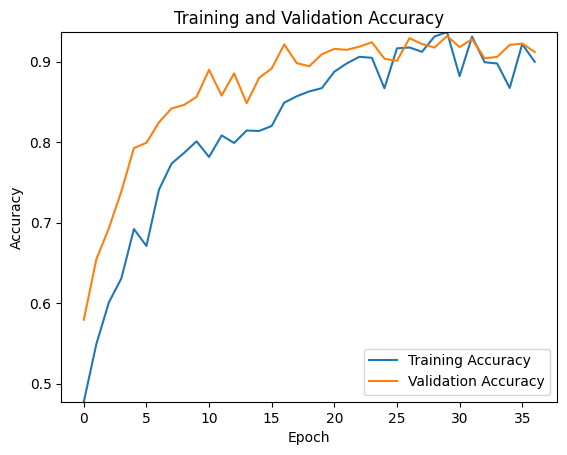

In [ ]:
import matplotlib.pyplot as plt
# Plot training and validation accuracy
plt.figure()
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim(min(train_acc + val_acc), max(train_acc + val_acc)) # Set y-axis limits
plt.legend()
plt.show()



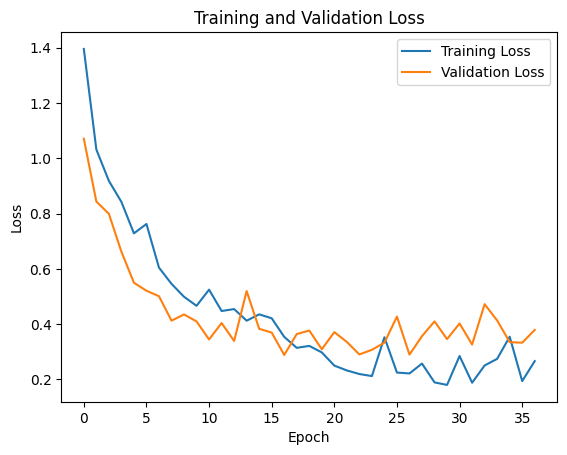

In [ ]:
# Plot training and validation loss
plt.figure()
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

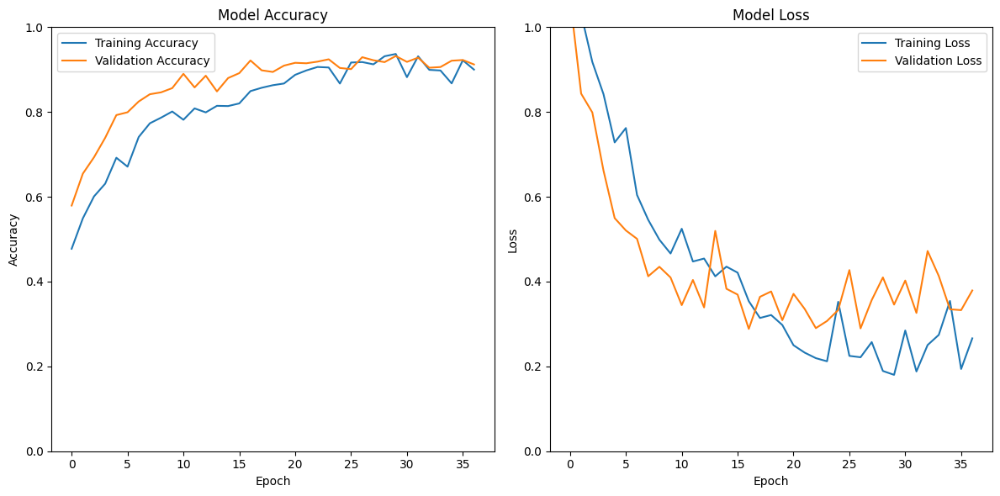

Test Loss: 0.3791
Test Accuracy: 0.9121
57/57 ━━━━━━━━━━━━━━━━━━━━ 20s 187ms/step

Classification Report:
                precision    recall  f1-score   support

         No_DR       0.99      0.96      0.97       362
          Mild       0.94      0.93      0.93       362
      Moderate       0.89      0.75      0.82       362
        Severe       0.95      0.96      0.95       362
Proliferate_DR       0.81      0.97      0.88       361

      accuracy                           0.91      1809
     macro avg       0.92      0.91      0.91      1809
  weighted avg       0.92      0.91      0.91      1809



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Plotting Accuracy and Loss curves
plt.figure(figsize=(12, 6))

# Accuracy curve
plt.subplot(1, 2, 1)
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.ylim([0, 1])  # Set y-axis limits
plt.legend()

# Loss curve
plt.subplot(1, 2, 2)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.ylim([0, 1])  # Set y-axis limits
plt.legend()

plt.tight_layout()
plt.show()

# Evaluate the model on the test data
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)

print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {accuracy:.4f}')

# Make predictions
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_classes, target_names=lis))



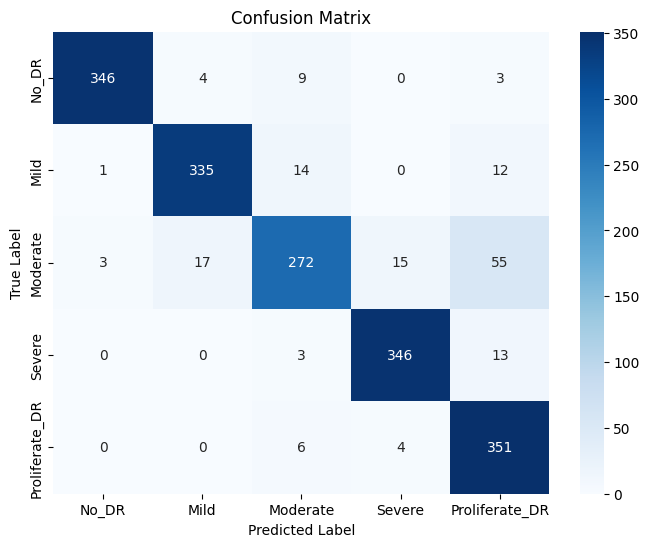

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred_classes)

# Print the confusion matrix using seaborn for better visualization
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=lis, yticklabels=lis)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

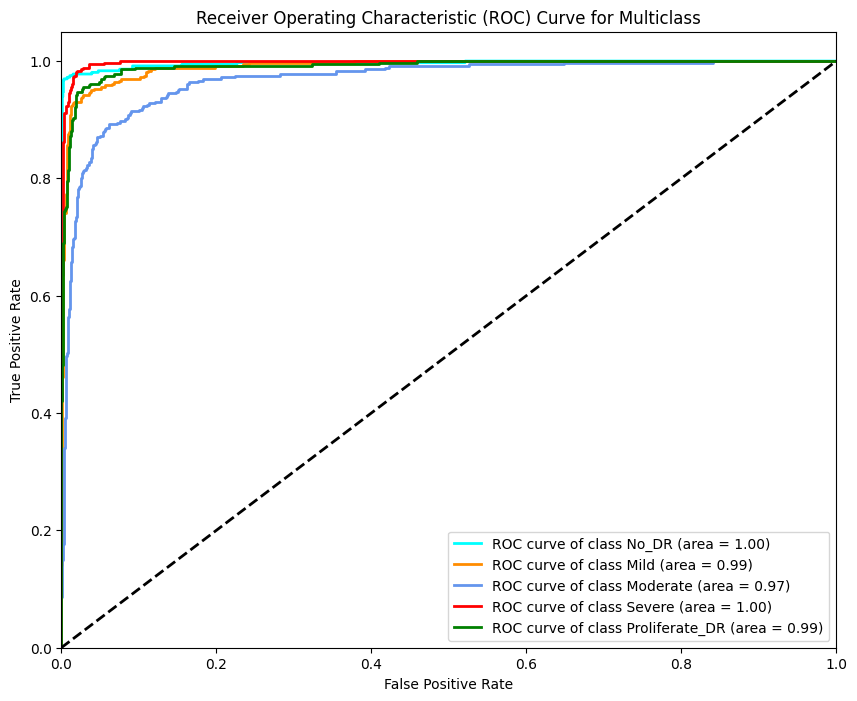

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the true labels for ROC curve plotting (for multiclass)
y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves for each class
plt.figure(figsize=(10, 8))
colors = ['aqua', 'darkorange', 'cornflowerblue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(lis[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()


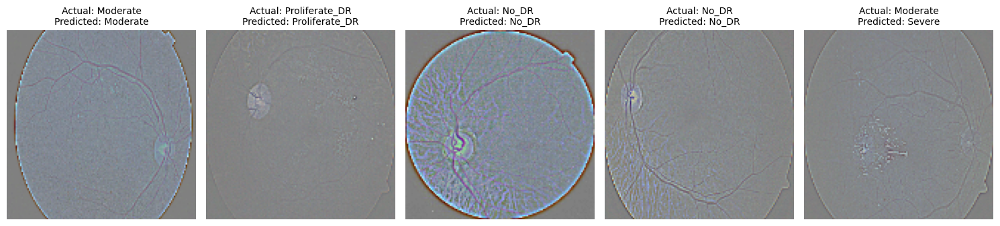

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
# Select a few examples from the test set
num_examples = 5
sample_indices = np.random.choice(len(X_test), num_examples, replace=False)

# Get the sample images, true labels, and predicted labels
sample_images = X_test[sample_indices]
sample_true_labels = y_test[sample_indices]
sample_predicted_labels = y_pred_classes[sample_indices]

# Map class indices to class names
class_names = list(Classes.keys())

# Display the images with actual and predicted labels
plt.figure(figsize=(15, 5))
for i in range(num_examples):
    plt.subplot(1, num_examples, i + 1)
    # Ensure the image is in the correct format for plotting (remove the normalization)
    img_display = (sample_images[i] * 255).astype(np.uint8)
    plt.imshow(img_display)
    true_label_name = class_names[sample_true_labels[i]]
    predicted_label_name = class_names[sample_predicted_labels[i]]
    plt.title(f'Actual: {true_label_name}\nPredicted: {predicted_label_name}', fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
!pip install --upgrade tensorflow-addons

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Using last convolutional layer: conv5_block16_2_conv


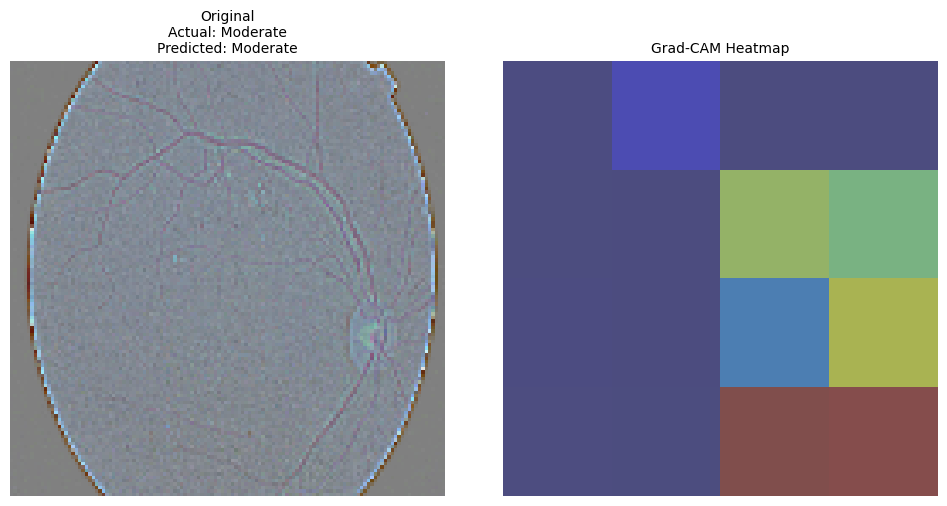

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import backend as K

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last convolutional layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last convolutional layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last convolutional layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important" this channel is with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize the heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img_path, heatmap, alpha=0.4):
    # Load the original image
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Resize heatmap to the original image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Apply colormap to the heatmap
    heatmap = np.uint8(255 * heatmap)
    colormap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Superimpose the heatmap on the original image
    superimposed_img = colormap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    return superimposed_img

# Choose an image to visualize (replace with a path from your test set)
# For example, pick one from the sample images displayed earlier
sample_image_index_to_visualize = sample_indices[0]
image_to_visualize = X_test[sample_image_index_to_visualize]
true_label_visualize = y_test[sample_image_index_to_visualize]
predicted_label_visualize = y_pred_classes[sample_image_index_to_visualize]

# Reshape the image for model prediction (add batch dimension)
img_array_for_gradcam = np.expand_dims(image_to_visualize, axis=0)

# Get the predicted class index
pred_index = np.argmax(model.predict(img_array_for_gradcam))

# Find the name of the last convolutional layer in your model
# You can inspect model.summary() to find this.
# For DenseNet121, a good candidate might be within the last dense block.
# Let's try 'conv5_block16_concat' or 'conv5_block16_2_conv' if available
# If the specific layer name changes, you'll need to adjust this.
last_conv_layer_name = None
for layer in reversed(model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer_name = layer.name
        break
print(f"Using last convolutional layer: {last_conv_layer_name}")


# Generate heatmap
heatmap = make_gradcam_heatmap(img_array_for_gradcam, model, last_conv_layer_name, pred_index=pred_index)

# Display the heatmap
plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1)
plt.imshow((image_to_visualize * 255).astype(np.uint8))
plt.title(f'Original\nActual: {class_names[true_label_visualize]}\nPredicted: {class_names[predicted_label_visualize]}', fontsize=10)
plt.axis('off')

# Heatmap
plt.subplot(1, 2, 2)
plt.imshow(image_to_visualize, cmap='gray') # Show original image as background (optional)
plt.imshow(heatmap, cmap='jet', alpha=0.4) # Superimpose heatmap
plt.title('Grad-CAM Heatmap', fontsize=10)
plt.axis('off')

plt.tight_layout()
plt.show()

# Note: Directly superimposing on the scaled image might be misleading.
# To truly superimpose on the original data scale, you would need the original unnormalized image.
# If you saved the original image paths, you could use those.
# The `display_gradcam` function attempts to resize the heatmap to an image,
# but without the original image file path, we'll skip calling it directly here
# and rely on plotting the heatmap over the unnormalized numpy array.



# **Training with attention based cnn model**

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │        896 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 64,    │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 32, 32,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 128)       │          0 │ max_pooling2d_2[… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 16)        │      2,048 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 128)       │      2,048 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 128) │          0 │ dense_3[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 16, 16,    │          0 │ max_pooling2d_2[… │
│                     │ 128)              │            │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 32768)     │          0 │ multiply[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 128)       │  4,194,432 │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128)       │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 5)         │        645 │ dropout_1[0][0] 

 Total params: 4,293,317 (16.38 MB)

 Trainable params: 4,292,869 (16.38 MB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.4683 - loss: 1.3287
Epoch 1: val_accuracy improved from -inf to 0.20011, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 16s 70ms/step - accuracy: 0.4688 - loss: 1.3272 - val_accuracy: 0.2001 - val_loss: 4.2679
Epoch 2/50
109/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.6352 - loss: 0.9227
Epoch 2: val_accuracy did not improve from 0.20011
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.6361 - loss: 0.9207 - val_accuracy: 0.2001 - val_loss: 5.8974
Epoch 3/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.7119 - loss: 0.7687
Epoch 3: val_accuracy did not improve from 0.20011
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.7121 - loss: 0.7682 - val_accuracy: 0.2001 - val_loss: 5.8391
Epoch 4/50
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8002 - loss: 0.5582
Epoch 4: val_accuracy improved from 0.20011 to 0.22167, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8005 - loss: 0.5578 - val_accuracy: 0.2217 - val_loss: 3.6492
Epoch 5/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8729 - loss: 0.3915
Epoch 5: val_accuracy improved from 0.22167 to 0.64511, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8729 - loss: 0.3913 - val_accuracy: 0.6451 - val_loss: 1.0212
Epoch 6/50
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9101 - loss: 0.2771
Epoch 6: val_accuracy improved from 0.64511 to 0.79989, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9104 - loss: 0.2765 - val_accuracy: 0.7999 - val_loss: 0.7615
Epoch 7/50
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9483 - loss: 0.1723
Epoch 7: val_accuracy improved from 0.79989 to 0.93864, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9484 - loss: 0.1721 - val_accuracy: 0.9386 - val_loss: 0.2574
Epoch 8/50
110/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9698 - loss: 0.1190
Epoch 8: val_accuracy did not improve from 0.93864
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9698 - loss: 0.1188 - val_accuracy: 0.9315 - val_loss: 0.2413
Epoch 9/50
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9729 - loss: 0.1004
Epoch 9: val_accuracy did not improve from 0.93864
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9730 - loss: 0.1004 - val_accuracy: 0.9326 - val_loss: 0.2429
Epoch 10/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9826 - loss: 0.0673
Epoch 10: val_accuracy did not improve from 0.93864
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9826 - loss: 0.0674 - val_accuracy: 0.8834 - val_loss: 0.3306
Epoch 11/50
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9780 - loss: 0.0847
Epoch 11: val_accuracy i

114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9781 - loss: 0.0845 - val_accuracy: 0.9469 - val_loss: 0.2045
Epoch 12/50
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9762 - loss: 0.0771
Epoch 12: val_accuracy improved from 0.94693 to 0.96020, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9762 - loss: 0.0771 - val_accuracy: 0.9602 - val_loss: 0.1645
Epoch 13/50
111/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9783 - loss: 0.0657
Epoch 13: val_accuracy did not improve from 0.96020
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9784 - loss: 0.0655 - val_accuracy: 0.8624 - val_loss: 0.4172
Epoch 14/50
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9826 - loss: 0.0542
Epoch 14: val_accuracy did not improve from 0.96020
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9826 - loss: 0.0543 - val_accuracy: 0.7949 - val_loss: 0.6339
Epoch 15/50
109/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9688 - loss: 0.0961
Epoch 15: val_accuracy did not improve from 0.96020
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9692 - loss: 0.0951 - val_accuracy: 0.9337 - val_loss: 0.2234
Epoch 16/50
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9824 - loss: 0.0492
Epoch 16: val_accura

114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9824 - loss: 0.0492 - val_accuracy: 0.9624 - val_loss: 0.1592
Epoch 17/50
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9918 - loss: 0.0377
Epoch 17: val_accuracy did not improve from 0.96241
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9918 - loss: 0.0378 - val_accuracy: 0.9558 - val_loss: 0.1645
Epoch 18/50
112/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9882 - loss: 0.0408
Epoch 18: val_accuracy improved from 0.96241 to 0.96683, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9882 - loss: 0.0409 - val_accuracy: 0.9668 - val_loss: 0.1468
Epoch 19/50
109/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9880 - loss: 0.0374
Epoch 19: val_accuracy did not improve from 0.96683
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9879 - loss: 0.0374 - val_accuracy: 0.9641 - val_loss: 0.1534
Epoch 20/50
109/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9869 - loss: 0.0466
Epoch 20: val_accuracy did not improve from 0.96683
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9869 - loss: 0.0468 - val_accuracy: 0.7673 - val_loss: 0.8396
Epoch 21/50
110/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9887 - loss: 0.0366
Epoch 21: val_accuracy did not improve from 0.96683
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9886 - loss: 0.0368 - val_accuracy: 0.7745 - val_loss: 1.2963
Epoch 22/50
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9890 - loss: 0.0348
Epoch 22: val_accura

114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9908 - loss: 0.0306 - val_accuracy: 0.9674 - val_loss: 0.1673
Epoch 26/50
109/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9908 - loss: 0.0276
Epoch 26: val_accuracy did not improve from 0.96739
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9907 - loss: 0.0278 - val_accuracy: 0.9165 - val_loss: 0.2925
Epoch 27/50
113/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9913 - loss: 0.0281
Epoch 27: val_accuracy did not improve from 0.96739
114/114 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9913 - loss: 0.0280 - val_accuracy: 0.9337 - val_loss: 0.2510
Epoch 28/50
110/114 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.9923 - loss: 0.0247
Epoch 28: val_accuracy improved from 0.96739 to 0.96960, saving model to attention_cnn_model.h5


114/114 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.9924 - loss: 0.0245 - val_accuracy: 0.9696 - val_loss: 0.1595
Epoch 28: early stopping
Test Loss (Attention CNN): 0.1595
Test Accuracy (Attention CNN): 0.9696
57/57 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step

Classification Report (Attention CNN):
                precision    recall  f1-score   support

         No_DR       0.96      0.98      0.97       362
          Mild       0.97      0.96      0.96       362
      Moderate       0.95      0.94      0.95       362
        Severe       0.98      0.99      0.99       362
Proliferate_DR       0.98      0.98      0.98       361

      accuracy                           0.97      1809
     macro avg       0.97      0.97      0.97      1809
  weighted avg       0.97      0.97      0.97      1809



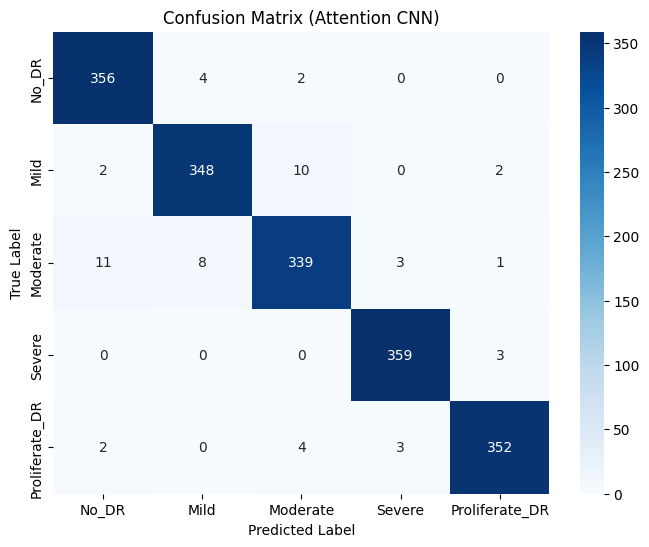

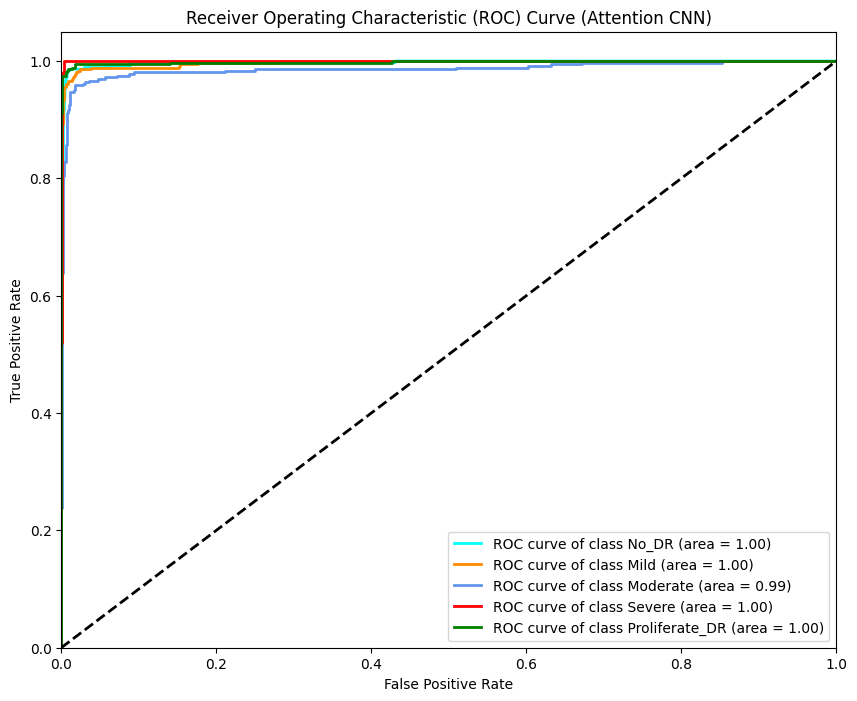

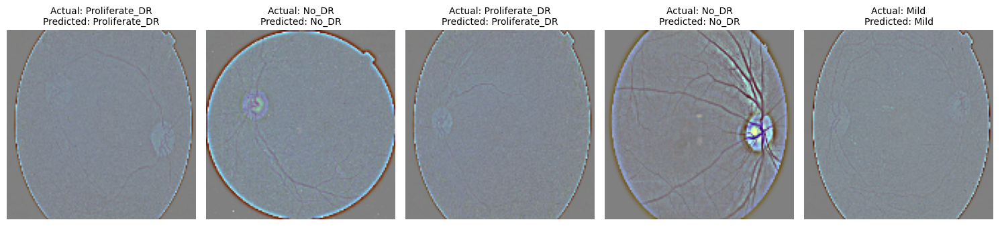

Using last convolutional layer for Grad-CAM (Attention CNN): conv2d_2
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 482ms/step


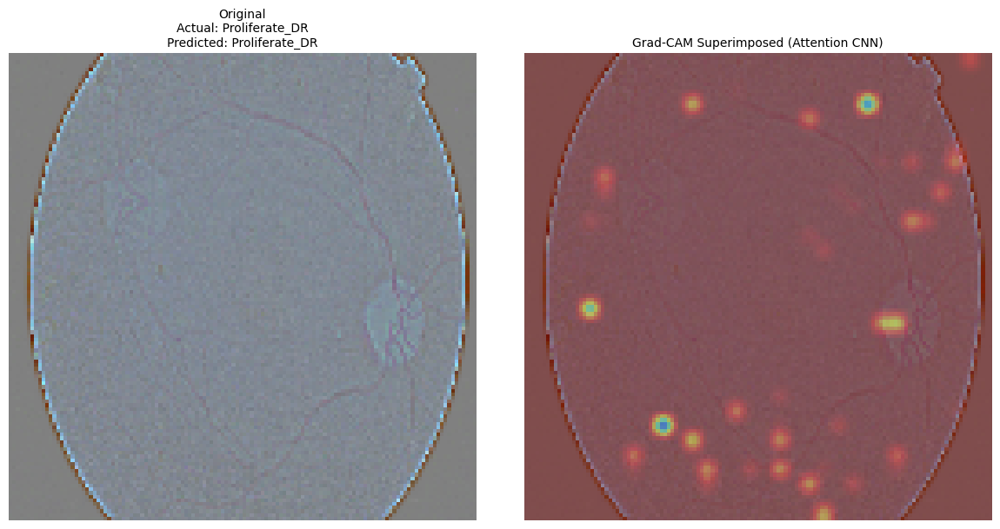

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


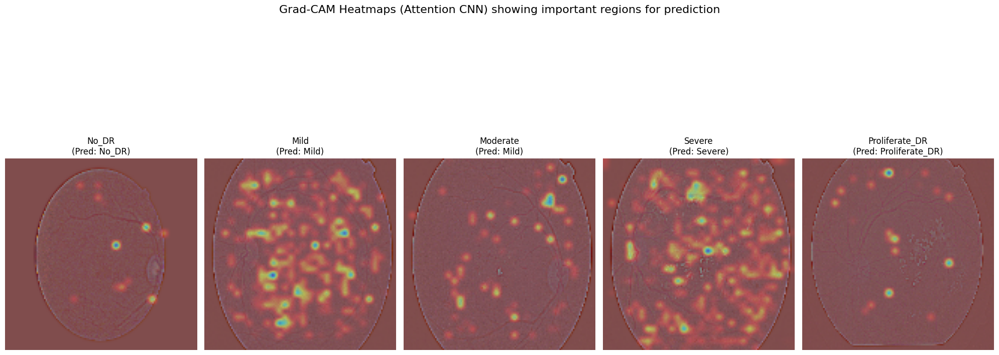

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.layers import GlobalAveragePooling2D, multiply, Permute, Reshape

def build_attention_cnn_model(input_shape=(128, 128, 3), num_classes=5):
    inputs = Input(shape=input_shape)

    # --- CNN Base ---
    x = Conv2D(32, (3, 3), padding='same', activation='relu')(inputs)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)

    x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = BatchNormalization()(x)
    conv_output = MaxPooling2D((2, 2))(x) # Output before attention

    # --- Attention Mechanism (Channel Attention) ---
    # Squeeze and Excitation style attention
    attention = GlobalAveragePooling2D()(conv_output)
    attention = Dense(128 // 8, activation='relu', use_bias=False)(attention) # Reduced number of neurons
    attention = Dense(128, activation='sigmoid', use_bias=False)(attention) # Match number of channels
    attention = Reshape((1, 1, 128))(attention) # Reshape for channel-wise multiplication
    attention_output = multiply([conv_output, attention]) # Apply attention to the feature maps

    # --- Classification Head ---
    x = Flatten()(attention_output)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.4)(x)
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Build the Attention CNN model
attention_cnn_model = build_attention_cnn_model(input_shape=(128, 128, 3), num_classes=len(Classes))
attention_cnn_model.summary()

# Compile the model
attention_cnn_model.compile(loss='sparse_categorical_crossentropy',
                          optimizer=keras.optimizers.Adam(learning_rate=0.0001), # Adjust learning rate
                          metrics=['accuracy'])

# Early Stopping and Model Checkpoint
es_attn = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.005, patience=10, verbose=1, mode='auto')
mc_attn = tf.keras.callbacks.ModelCheckpoint(filepath='attention_cnn_model.h5', monitor='val_accuracy', verbose=1, save_best_only=True, mode='auto')
cd_attn = [es_attn, mc_attn]

# Train the model
gc.collect()
history_attn = attention_cnn_model.fit(x=X_train, y=y_train,
                                   validation_data=(X_test, y_test),
                                   epochs=50, # You might need to adjust epochs
                                   callbacks=cd_attn,
                                   batch_size=64,
                                   shuffle=True)

# Evaluate the model
loss_attn, accuracy_attn = attention_cnn_model.evaluate(X_test, y_test, verbose=0)

print(f'Test Loss (Attention CNN): {loss_attn:.4f}')
print(f'Test Accuracy (Attention CNN): {accuracy_attn:.4f}')

# Make predictions
y_pred_attn = attention_cnn_model.predict(X_test)
y_pred_classes_attn = np.argmax(y_pred_attn, axis=1)

# Print classification report
print("\nClassification Report (Attention CNN):")
print(classification_report(y_test, y_pred_classes_attn, target_names=lis))

# Confusion Matrix
from sklearn.metrics import confusion_matrix
cm_attn = confusion_matrix(y_test, y_pred_classes_attn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_attn, annot=True, fmt='d', cmap='Blues', xticklabels=lis, yticklabels=lis)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Attention CNN)')
plt.show()

# ROC Curve (Multiclass)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

y_test_bin_attn = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin_attn.shape[1]

fpr_attn = dict()
tpr_attn = dict()
roc_auc_attn = dict()
for i in range(n_classes):
    fpr_attn[i], tpr_attn[i], _ = roc_curve(y_test_bin_attn[:, i], y_pred_attn[:, i])
    roc_auc_attn[i] = auc(fpr_attn[i], tpr_attn[i])

plt.figure(figsize=(10, 8))
colors = ['aqua', 'darkorange', 'cornflowerblue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr_attn[i], tpr_attn[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(lis[i], roc_auc_attn[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (Attention CNN)')
plt.legend(loc="lower right")
plt.show()

# Visualize predictions
num_examples = 5
sample_indices_attn = np.random.choice(len(X_test), num_examples, replace=False)

sample_images_attn = X_test[sample_indices_attn]
sample_true_labels_attn = y_test[sample_indices_attn]
sample_predicted_labels_attn = y_pred_classes_attn[sample_indices_attn]

class_names = list(Classes.keys())

plt.figure(figsize=(15, 5))
for i in range(num_examples):
    plt.subplot(1, num_examples, i + 1)
    img_display = (sample_images_attn[i] * 255).astype(np.uint8)
    plt.imshow(img_display)
    true_label_name = class_names[sample_true_labels_attn[i]]
    predicted_label_name = class_names[sample_predicted_labels_attn[i]]
    plt.title(f'Actual: {true_label_name}\nPredicted: {predicted_label_name}', fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Grad-CAM for Attention CNN (using the last conv layer before attention)
# The last conv layer in the attention CNN is named 'conv2d_2' (or similar depending on build order)
last_conv_layer_name_attn = None
for layer in reversed(attention_cnn_model.layers):
    if isinstance(layer, tf.keras.layers.Conv2D):
        last_conv_layer_name_attn = layer.name
        break
print(f"Using last convolutional layer for Grad-CAM (Attention CNN): {last_conv_layer_name_attn}")

if last_conv_layer_name_attn:
    # Choose an image to visualize (e.g., the first sample from the visualization)
    sample_image_index_to_visualize_attn = sample_indices_attn[0]
    image_to_visualize_attn = X_test[sample_image_index_to_visualize_attn]
    true_label_visualize_attn = y_test[sample_image_index_to_visualize_attn]
    predicted_label_visualize_attn = y_pred_classes_attn[sample_image_index_to_visualize_attn]

    img_array_for_gradcam_attn = np.expand_dims(image_to_visualize_attn, axis=0)
    pred_index_attn = np.argmax(attention_cnn_model.predict(img_array_for_gradcam_attn))

    heatmap_attn = make_gradcam_heatmap(img_array_for_gradcam_attn, attention_cnn_model, last_conv_layer_name_attn, pred_index=pred_index_attn)
    superimposed_image_attn = superimpose_heatmap_on_image(image_to_visualize_attn, heatmap_attn)

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    display_img_attn = (image_to_visualize_attn * 255).astype(np.uint8) if np.max(image_to_visualize_attn) <= 1.01 else image_to_visualize_attn.astype(np.uint8)
    plt.imshow(display_img_attn)
    plt.title(f'Original\nActual: {class_names[true_label_visualize_attn]}\nPredicted: {class_names[predicted_label_visualize_attn]}', fontsize=10)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_image_attn)
    plt.title('Grad-CAM Superimposed (Attention CNN)', fontsize=10)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    # Visualize Grad-CAM for one example from each class for the Attention CNN
    if not class_indices_to_visualize:
        print("Could not find any images in the test set for visualization.")
    else:
        plt.figure(figsize=(20, 10))

        for i, sample_image_index_to_visualize_attn in enumerate(class_indices_to_visualize): # Re-using the same class indices as before
            image_to_visualize_attn = X_test[sample_image_index_to_visualize_attn]
            true_label_visualize_attn = y_test[sample_image_index_to_visualize_attn]
            # Predict using the Attention CNN model
            img_array_for_gradcam_attn = np.expand_dims(image_to_visualize_attn, axis=0)
            y_pred_single_attn = attention_cnn_model.predict(img_array_for_gradcam_attn)
            predicted_label_visualize_attn = np.argmax(y_pred_single_attn)
            pred_index_attn = predicted_label_visualize_attn # Use the predicted index


            # Find the name of the last convolutional layer before attention
            last_conv_layer_name_attn = None
            for layer in reversed(attention_cnn_model.layers):
                 if isinstance(layer, tf.keras.layers.Conv2D):
                     last_conv_layer_name_attn = layer.name
                     break

            if last_conv_layer_name_attn is None:
                print("Could not find a convolutional layer in the Attention CNN model.")
                continue

            # Generate heatmap
            heatmap_attn = make_gradcam_heatmap(img_array_for_gradcam_attn, attention_cnn_model, last_conv_layer_name_attn, pred_index=pred_index_attn)

            # Superimpose heatmap on the original image array
            superimposed_image_attn = superimpose_heatmap_on_image(image_to_visualize_attn, heatmap_attn)

            # Display the superimposed image
            plt.subplot(1, len(class_indices_to_visualize), i + 1)
            plt.imshow(superimposed_image_attn)
            plt.title(f'{class_names[true_label_visualize_attn]}\n(Pred: {class_names[predicted_label_visualize_attn]})', fontsize=12)
            plt.axis('off')

        plt.suptitle("Grad-CAM Heatmaps (Attention CNN) showing important regions for prediction", fontsize=16)
        plt.tight_layout()
        plt.show()

else:
    print("Skipping Grad-CAM visualization for Attention CNN as the last convolutional layer name could not be found.")



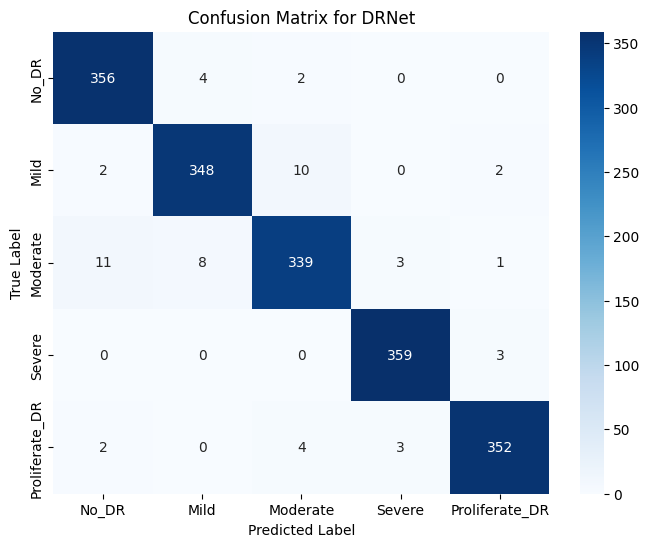

In [ ]:
from sklearn.metrics import confusion_matrix
cm_attn = confusion_matrix(y_test, y_pred_classes_attn)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_attn, annot=True, fmt='d', cmap='Blues', xticklabels=lis, yticklabels=lis)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix for DRNet')
plt.show()



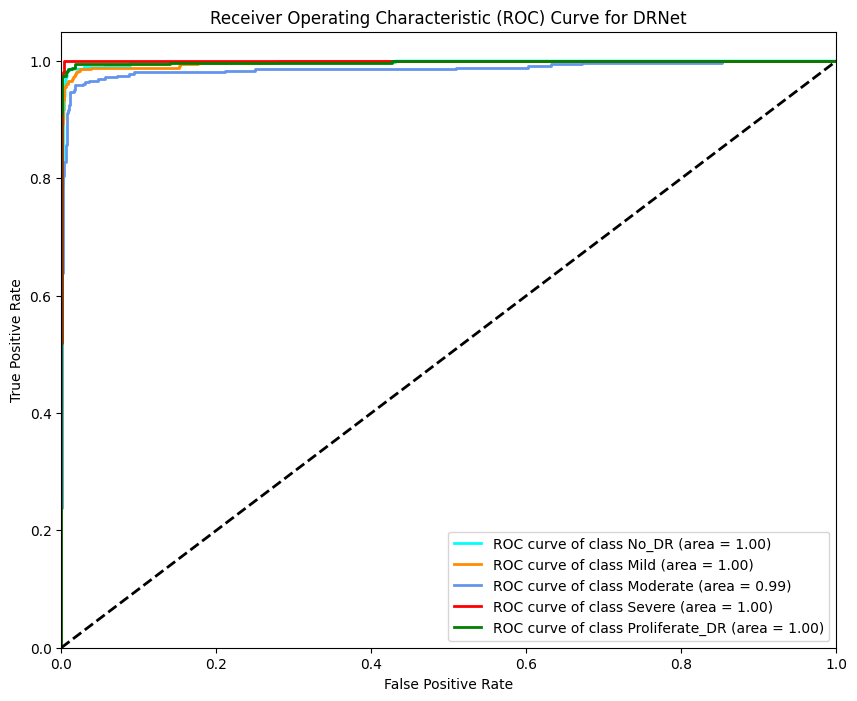

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

y_test_bin_attn = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin_attn.shape[1]

fpr_attn = dict()
tpr_attn = dict()
roc_auc_attn = dict()
for i in range(n_classes):
    fpr_attn[i], tpr_attn[i], _ = roc_curve(y_test_bin_attn[:, i], y_pred_attn[:, i])
    roc_auc_attn[i] = auc(fpr_attn[i], tpr_attn[i])

plt.figure(figsize=(10, 8))
colors = ['aqua', 'darkorange', 'cornflowerblue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr_attn[i], tpr_attn[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(lis[i], roc_auc_attn[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for DRNet')
plt.legend(loc="lower right")
plt.show()



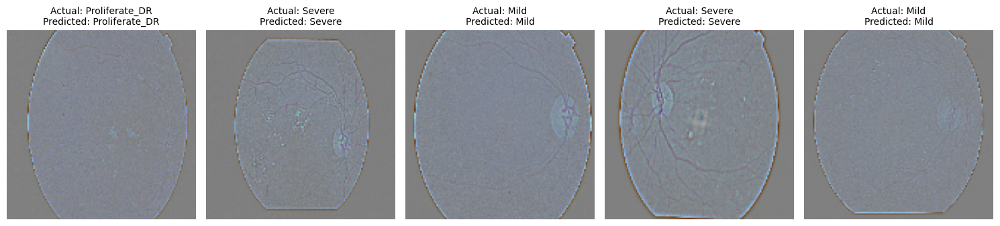

In [ ]:
num_examples = 5
sample_indices_attn = np.random.choice(len(X_test), num_examples, replace=False)

sample_images_attn = X_test[sample_indices_attn]
sample_true_labels_attn = y_test[sample_indices_attn]
sample_predicted_labels_attn = y_pred_classes_attn[sample_indices_attn]

class_names = list(Classes.keys())

plt.figure(figsize=(15, 5))
for i in range(num_examples):
    plt.subplot(1, num_examples, i + 1)
    img_display = (sample_images_attn[i] * 255).astype(np.uint8)
    plt.imshow(img_display)
    true_label_name = class_names[sample_true_labels_attn[i]]
    predicted_label_name = class_names[sample_predicted_labels_attn[i]]
    plt.title(f'Actual: {true_label_name}\nPredicted: {predicted_label_name}', fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
print("\n--- Final Evaluation Metrics ---")

# Training Metrics (from the last epoch)
print(f"Training Loss: {history.history['loss'][-1]:.4f}")
print(f"Training Accuracy: {history.history['accuracy'][-1]:.4f}")

# Test Metrics (from model.evaluate)
print(f'Test Loss: {loss:.4f}')
print(f'Test Accuracy: {accuracy:.4f}')

# Precision, Recall, F1-score (from the classification_report printed previously)
# To reiterate, we can explicitly calculate them or just confirm the output above.
# Let's just confirm the output from the classification_report.
print("\nClassification Report (Precision, Recall, F1-score):")
print(classification_report(y_test, y_pred_classes, target_names=lis))

# For the Attention CNN model as well:
print("\n--- Final Evaluation Metrics (Attention CNN) ---")

# Training Metrics (from the last epoch)
if 'loss' in history_attn.history and 'accuracy' in history_attn.history:
    print(f"Training Loss (Attention CNN): {history_attn.history['loss'][-1]:.4f}")
    print(f"Training Accuracy (Attention CNN): {history_attn.history['accuracy'][-1]:.4f}")
else:
    print("Training history for Attention CNN is incomplete.")


# Test Metrics (from model.evaluate)
print(f'Test Loss (Attention CNN): {loss_attn:.4f}')
print(f'Test Accuracy (Attention CNN): {accuracy_attn:.4f}')

# Precision, Recall, F1-score (from the classification_report for Attention CNN)
print("\nClassification Report (Attention CNN - Precision, Recall, F1-score):")
print(classification_report(y_test, y_pred_classes_attn, target_names=lis))



--- Final Evaluation Metrics ---
Training Loss: 0.2662
Training Accuracy: 0.8999
Test Loss: 0.3791
Test Accuracy: 0.9121

Classification Report (Precision, Recall, F1-score):
                precision    recall  f1-score   support

         No_DR       0.99      0.96      0.97       362
          Mild       0.94      0.93      0.93       362
      Moderate       0.89      0.75      0.82       362
        Severe       0.95      0.96      0.95       362
Proliferate_DR       0.81      0.97      0.88       361

      accuracy                           0.91      1809
     macro avg       0.92      0.91      0.91      1809
  weighted avg       0.92      0.91      0.91      1809


--- Final Evaluation Metrics (Attention CNN) ---
Training Loss (Attention CNN): 0.0222
Training Accuracy (Attention CNN): 0.9930
Test Loss (Attention CNN): 0.1595
Test Accuracy (Attention CNN): 0.9696

Classification Report (Attention CNN - Precision, Recall, F1-score):
                precision    recall  f1-score

In [ ]:
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef, jaccard_score, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.layers import GlobalAveragePooling2D, Reshape, multiply
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


# Calculate Kappa score
kappa = cohen_kappa_score(y_test, y_pred_classes)
print(f"Kappa Score: {kappa:.4f}")

# Calculate MCC score
mcc = matthews_corrcoef(y_test, y_pred_classes)
print(f"MCC Score: {mcc:.4f}")

# Calculate Jaccard score (average over classes)
# The jaccard_score function can compute this for multiclass
jaccard = jaccard_score(y_test, y_pred_classes, average='macro') # 'macro' calculates score for each class and finds unweighted mean
print(f"Jaccard Score (macro avg): {jaccard:.4f}")

# You can also get the Jaccard score for each class if needed:
# jaccard_per_class = jaccard_score(y_test, y_pred_classes, average=None)
# print(f"Jaccard Score per class: {jaccard_per_class}")

# For the Attention CNN model:
print("\n--- Attention CNN Metrics ---")

# Calculate Kappa score for Attention CNN
kappa_attn = cohen_kappa_score(y_test, y_pred_classes_attn)
print(f"Kappa Score (Attention CNN): {kappa_attn:.4f}")

# Calculate MCC score for Attention CNN
mcc_attn = matthews_corrcoef(y_test, y_pred_classes_attn)
print(f"MCC Score (Attention CNN): {mcc_attn:.4f}")

# Calculate Jaccard score for Attention CNN
jaccard_attn = jaccard_score(y_test, y_pred_classes_attn, average='macro')
print(f"Jaccard Score (Attention CNN - macro avg): {jaccard_attn:.4f}")

# Optionally, you can print the classification reports again which already include precision, recall, f1-score
print("\nClassification Report (DenseNet Model):")
print(classification_report(y_test, y_pred_classes, target_names=lis))

print("\nClassification Report (Attention CNN Model):")
print(classification_report(y_test, y_pred_classes_attn, target_names=lis))



Kappa Score: 0.8901
MCC Score: 0.8916
Jaccard Score (macro avg): 0.8418

--- Attention CNN Metrics ---
Kappa Score (Attention CNN): 0.9620
MCC Score (Attention CNN): 0.9620
Jaccard Score (Attention CNN - macro avg): 0.9413

Classification Report (DenseNet Model):
                precision    recall  f1-score   support

         No_DR       0.99      0.96      0.97       362
          Mild       0.94      0.93      0.93       362
      Moderate       0.89      0.75      0.82       362
        Severe       0.95      0.96      0.95       362
Proliferate_DR       0.81      0.97      0.88       361

      accuracy                           0.91      1809
     macro avg       0.92      0.91      0.91      1809
  weighted avg       0.92      0.91      0.91      1809


Classification Report (Attention CNN Model):
                precision    recall  f1-score   support

         No_DR       0.96      0.98      0.97       362
          Mild       0.97      0.96      0.96       362
      Moderate

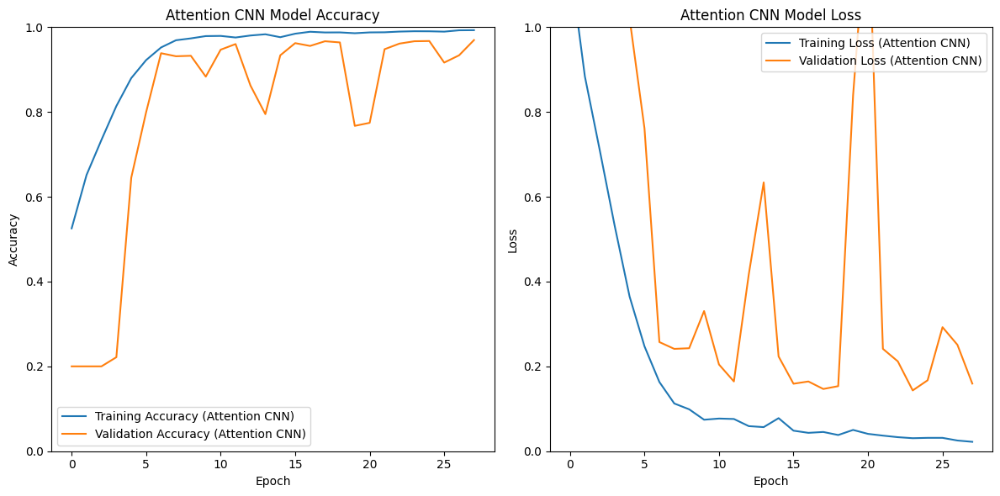

In [ ]:
import matplotlib.pyplot as plt
# Plotting Accuracy and Loss curves for the Attention CNN model
plt.figure(figsize=(12, 6))

# Accuracy curve for Attention CNN
plt.subplot(1, 2, 1)
plt.plot(history_attn.history['accuracy'], label='Training Accuracy (Attention CNN)')
plt.plot(history_attn.history['val_accuracy'], label='Validation Accuracy (Attention CNN)')
plt.title('Attention CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.ylim([0, 1])  # Set y-axis limits
plt.legend()

# Loss curve for Attention CNN
plt.subplot(1, 2, 2)
plt.plot(history_attn.history['loss'], label='Training Loss (Attention CNN)')
plt.plot(history_attn.history['val_loss'], label='Validation Loss (Attention CNN)')
plt.title('Attention CNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.ylim([0, 1])  # Set y-axis limits
plt.legend()

plt.tight_layout()
plt.show()


# **From this, these codes are for Future study**

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_14 (Conv2D)  │ (None, 128, 128,  │      9,472 │ input_layer_7[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_14[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_13    │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 64, 64,    │          0 │ max_pooling2d_13… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_15 (Conv2D)  │ (None, 64, 64,    │    204,928 │ dropout_4[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_15[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_14    │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 32, 32,    │          0 │ max_pooling2d_14… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_16 (Conv2D)  │ (None, 32, 32,    │    295,168 │ dropout_5[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_16[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_15    │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 256)       │          0 │ max_pooling2d_15… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 16)        │      4,096 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_13 (Dense)    │ (None, 256)       │      4,096 │ dense_12[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 1, 1, 256) │          0 │ dense_13[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_2          │ (None, 16, 16,    │          0 │ max_pooling2d_15… │
│ (Multiply)          │ 256)              │            │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_17 (Conv2D)  │ (None, 16, 16, 1) │     12,545 │ multiply_2[0][0]

 Total params: 17,310,854 (66.04 MB)

 Trainable params: 17,309,958 (66.03 MB)

 Non-trainable params: 896 (3.50 KB)

Training the improved Attention CNN model (V4)...
Epoch 1/150
227/227 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.3632 - loss: 2.2033
Epoch 1: val_accuracy improved from -inf to 0.20011, saving model to attention_cnn_model_v4.keras
227/227 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.3633 - loss: 2.2029 - val_accuracy: 0.2001 - val_loss: 5.6075 - learning_rate: 5.0000e-05
Epoch 2/150
224/227 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4450 - loss: 1.9755
Epoch 2: val_accuracy improved from 0.20011 to 0.20177, saving model to attention_cnn_model_v4.keras
227/227 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.4449 - loss: 1.9754 - val_accuracy: 0.2018 - val_loss: 4.6698 - learning_rate: 5.0000e-05
Epoch 3/150
225/227 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4615 - loss: 1.8959
Epoch 3: val_accuracy improved from 0.20177 to 0.41459, saving model to attention_cnn_model_v4.keras
227/227 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - accuracy: 0.4616 - loss: 1.8958 - val_accuracy: 0

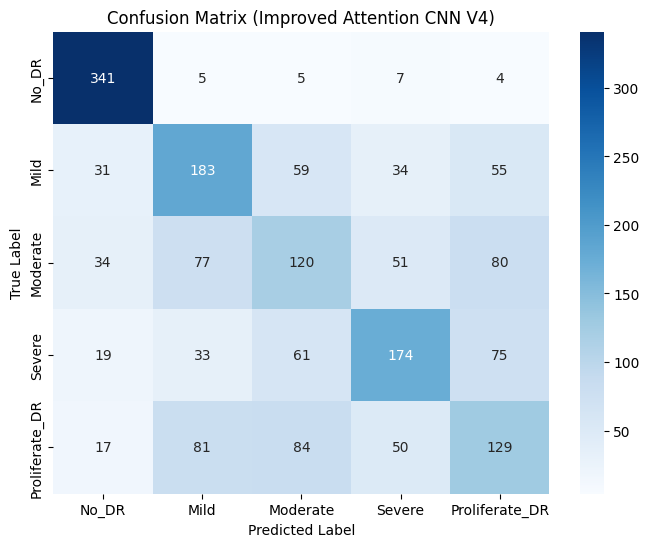

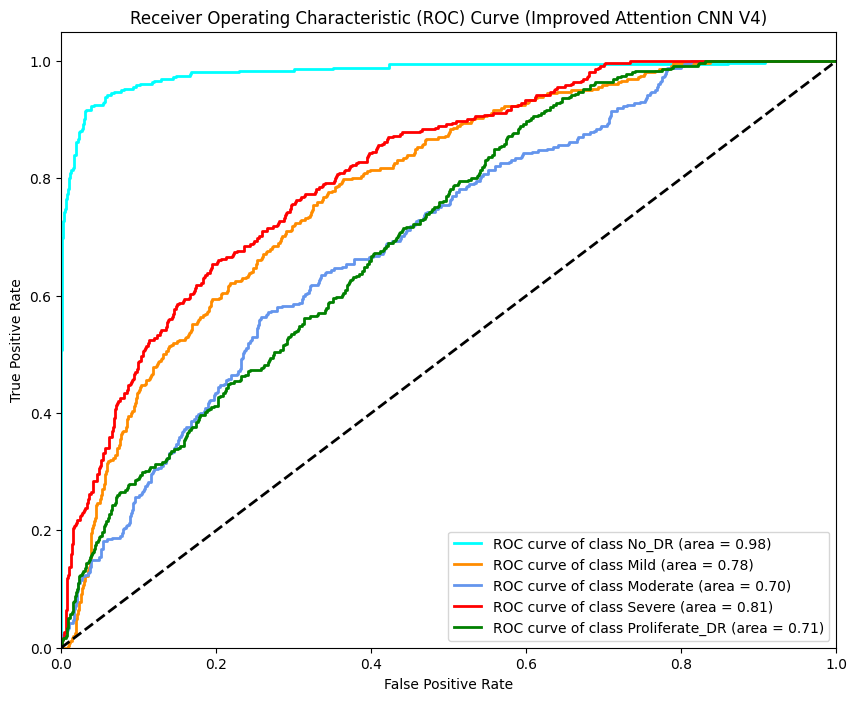

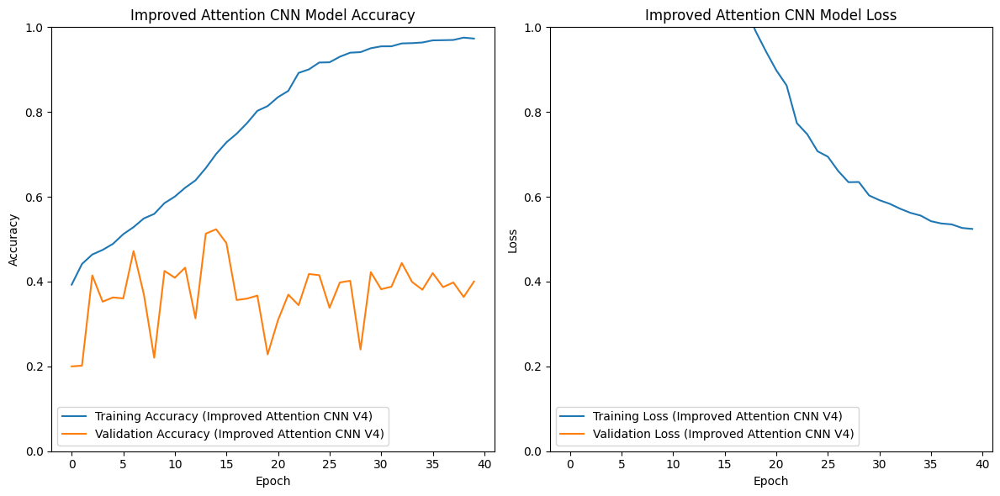

Using last convolutional layer for Grad-CAM (Improved Attention CNN V4): conv2d_17
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 538ms/step


NameError: name 'make_gradcam_heatmap' is not defined

<Figure size 2000x1000 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.layers import GlobalAveragePooling2D, Reshape, multiply, add, Dropout, Conv2D, MaxPooling2D, BatchNormalization, Input, Dense, Flatten
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix, roc_curve, auc
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.applications.densenet import preprocess_input
import cv2 # Import cv2 for image manipulation in Grad-CAM

# Define Grad-CAM helper functions within this cell
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last convolutional layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last convolutional layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last convolutional layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important" this channel is with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize the heatmap
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

# Function to superimpose heatmap on an image array
def superimpose_heatmap_on_image(img_array, heatmap, alpha=0.4):
    """Superimposes the heatmap on the image array."""
    # Resize heatmap to the image size
    heatmap = cv2.resize(heatmap, (img_array.shape[1], img_array.shape[0]))

    # Apply colormap to the heatmap
    heatmap = np.uint8(255 * heatmap)
    colormap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Convert image array to uint8 (assuming it's normalized 0-1 or float 0-255)
    # If your img_array is 0-1 float, scale it first
    if np.max(img_array) <= 1.01: # Simple check for normalization
        img_array = (img_array * 255).astype(np.uint8)
    else:
        img_array = img_array.astype(np.uint8)

    # Ensure image and heatmap have same depth (convert grayscale heatmap to 3 channels)
    if len(colormap.shape) == 2 and len(img_array.shape) == 3:
        colormap = cv2.cvtColor(colormap, cv2.COLOR_GRAY2BGR)
    elif len(colormap.shape) == 3 and len(img_array.shape) == 2:
         img_array = cv2.cvtColor(img_array, cv2.COLOR_GRAY2BGR)


    # Superimpose the heatmap on the original image
    superimposed_img = cv2.addWeighted(img_array, 1 - alpha, colormap, alpha, 0)
    superimposed_img = np.clip(superimposed_img, 0, 255).astype(np.uint8)

    return superimposed_img


def build_attention_cnn_model_v4(input_shape=(128, 128, 3), num_classes=5):
    inputs = Input(shape=input_shape)

    # --- CNN Base ---
    # Adjusted filter sizes and added more layers
    x = Conv2D(64, (7, 7), padding='same', activation='relu', kernel_regularizer=l2(0.001))(inputs) # Increased L2 regularization
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x) # Increased Dropout

    x = Conv2D(128, (5, 5), padding='same', activation='relu', kernel_regularizer=l2(0.001))(x) # Increased L2 regularization
    x = BatchNormalization()(x)
    x = MaxPooling2D((2, 2))(x)
    x = Dropout(0.3)(x) # Increased Dropout

    x = Conv2D(256, (3, 3), padding='same', activation='relu', kernel_regularizer=l2(0.001))(x) # Increased L2 regularization
    x = BatchNormalization()(x)
    conv_output = MaxPooling2D((2, 2))(x) # Output before attention
    x = Dropout(0.3)(x) # Increased Dropout


    # --- Attention Mechanism (Combined Channel and Spatial Attention) ---
    # Channel Attention
    channel_attention = GlobalAveragePooling2D()(conv_output)
    channel_attention = Dense(conv_output.shape[-1] // 16, activation='relu', use_bias=False)(channel_attention)
    channel_attention = Dense(conv_output.shape[-1], activation='sigmoid', use_bias=False)(channel_attention)
    channel_attention = Reshape((1, 1, conv_output.shape[-1]))(channel_attention)
    attended_features = multiply([conv_output, channel_attention])

    # Spatial Attention
    spatial_attention = Conv2D(1, (7, 7), padding='same', activation='sigmoid')(attended_features) # Larger kernel
    attended_features = multiply([attended_features, spatial_attention])

    # Optional: Add the original features back (residual connection)
    # This can help the model learn to use the original features as well
    # attended_features = add([conv_output, attended_features])


    # --- Classification Head ---
    x = Flatten()(attended_features)
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.001))(x) # Increased L2 regularization
    x = Dropout(0.6)(x) # Increased Dropout rate
    outputs = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# Build the improved Attention CNN model
attention_cnn_model_v4 = build_attention_cnn_model_v4(input_shape=(128, 128, 3), num_classes=len(Classes))
attention_cnn_model_v4.summary()

# Compile the model
# Adjusted learning rate and added regularization
adam_v4 = keras.optimizers.Adam(learning_rate=0.00005) # Slightly reduced learning rate
attention_cnn_model_v4.compile(loss='sparse_categorical_crossentropy',
                          optimizer=adam_v4,
                          metrics=['accuracy'])

# Early Stopping and Model Checkpoint
es_attn_v4 = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0.005, patience=25, verbose=1, mode='auto', restore_best_weights=True) # Increased patience
mc_attn_v4 = tf.keras.callbacks.ModelCheckpoint(filepath='attention_cnn_model_v4.keras', monitor='val_accuracy', verbose=1, save_best_only=True, mode='auto') # Save in Keras native format
# Add ReduceLROnPlateau
reduce_lr_v4 = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=7, min_lr=0.000001, verbose=1) # Increased patience for LR reduction

cd_attn_v4 = [es_attn_v4, mc_attn_v4, reduce_lr_v4]

# Data Augmentation (to reduce overfitting)
data_augmentation = keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.15), # Slightly increased rotation
  layers.RandomZoom(0.15), # Slightly increased zoom
  layers.RandomContrast(0.15), # Slightly increased contrast
  layers.RandomTranslation(height_factor=0.15, width_factor=0.15), # Slightly increased translation
])

# Train the model with data augmentation
print("Training the improved Attention CNN model (V4)...")
gc.collect()
history_attn_v4 = attention_cnn_model_v4.fit(
    data_augmentation(X_train), y_train, # Apply data augmentation
    validation_data=(X_test, y_test),
    epochs=150, # Increased epochs, relying on Early Stopping
    callbacks=cd_attn_v4,
    batch_size=32, # Smaller batch size can sometimes help regularization
    shuffle=True
)

print("\nEvaluating the improved Attention CNN model (V4)...")
# Evaluate the model
loss_attn_v4, accuracy_attn_v4 = attention_cnn_model_v4.evaluate(X_test, y_test, verbose=0)

print(f'Test Loss (Improved Attention CNN V4): {loss_attn_v4:.4f}')
print(f'Test Accuracy (Improved Attention CNN V4): {accuracy_attn_v4:.4f}')

# Make predictions
y_pred_attn_v4 = attention_cnn_model_v4.predict(X_test)
y_pred_classes_attn_v4 = np.argmax(y_pred_attn_v4, axis=1)

# Print classification report
print("\nClassification Report (Improved Attention CNN V4):")
print(classification_report(y_test, y_pred_classes_attn_v4, target_names=lis))

# Confusion Matrix
cm_attn_v4 = confusion_matrix(y_test, y_pred_classes_attn_v4)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_attn_v4, annot=True, fmt='d', cmap='Blues', xticklabels=lis, yticklabels=lis)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Improved Attention CNN V4)')
plt.show()

# ROC Curve (Multiclass)

y_test_bin_attn_v4 = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin_attn_v4.shape[1]

fpr_attn_v4 = dict()
tpr_attn_v4 = dict()
roc_auc_attn_v4 = dict()
for i in range(n_classes):
    fpr_attn_v4[i], tpr_attn_v4[i], _ = roc_curve(y_test_bin_attn_v4[:, i], y_pred_attn_v4[:, i])
    roc_auc_attn_v4[i] = auc(fpr_attn_v4[i], tpr_attn_v4[i])

plt.figure(figsize=(10, 8))
colors = ['aqua', 'darkorange', 'cornflowerblue', 'red', 'green']
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr_attn_v4[i], tpr_attn_v4[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(lis[i], roc_auc_attn_v4[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (Improved Attention CNN V4)')
plt.legend(loc="lower right")
plt.show()


# Plotting Accuracy and Loss curves for the Improved Attention CNN model
plt.figure(figsize=(12, 6))

# Accuracy curve for Improved Attention CNN
plt.subplot(1, 2, 1)
plt.plot(history_attn_v4.history['accuracy'], label='Training Accuracy (Improved Attention CNN V4)')
plt.plot(history_attn_v4.history['val_accuracy'], label='Validation Accuracy (Improved Attention CNN V4)')
plt.title('Improved Attention CNN Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.ylim([0, 1])  # Set y-axis limits
plt.legend()

# Loss curve for Improved Attention CNN
plt.subplot(1, 2, 2)
plt.plot(history_attn_v4.history['loss'], label='Training Loss (Improved Attention CNN V4)')
plt.plot(history_attn_v4.history['val_loss'], label='Validation Loss (Improved Attention CNN V4)')
plt.title('Improved Attention CNN Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.ylim([0, 1])  # Set y-axis limits
plt.legend()

plt.tight_layout()
plt.show()

# Redefine class_indices_to_visualize for Grad-CAM visualization
class_indices_to_visualize = []
for class_idx in range(len(lis)): # Iterate through all classes
    # Find an index in X_test that belongs to this class
    indices_of_class = np.where(y_test == class_idx)[0]
    if len(indices_of_class) > 0:
        # Take the first index found for this class
        class_indices_to_visualize.append(indices_of_class[0])
    if len(class_indices_to_visualize) == len(lis): # Stop if we have one example for each class
        break

# Grad-CAM for Improved Attention CNN
# The last conv layer before the attention mechanisms
last_conv_layer_name_attn_v4 = None
for layer in reversed(attention_cnn_model_v4.layers):
    if isinstance(layer, tf.keras.layers.Conv2D) and 'spatial_attention' not in layer.name: # Exclude the spatial attention conv layer
        last_conv_layer_name_attn_v4 = layer.name
        break
print(f"Using last convolutional layer for Grad-CAM (Improved Attention CNN V4): {last_conv_layer_name_attn_v4}")

if last_conv_layer_name_attn_v4:
    # Visualize Grad-CAM for one example from each class for the Improved Attention CNN
    if not class_indices_to_visualize:
        print("Could not find any images in the test set for visualization.")
    else:
        plt.figure(figsize=(20, 10))

        for i, sample_image_index_to_visualize_attn_v4 in enumerate(class_indices_to_visualize): # Re-using the same class indices
            image_to_visualize_attn_v4 = X_test[sample_image_index_to_visualize_attn_v4]
            true_label_visualize_attn_v4 = y_test[sample_image_index_to_visualize_attn_v4]
            # Predict using the Improved Attention CNN model
            img_array_for_gradcam_attn_v4 = np.expand_dims(image_to_visualize_attn_v4, axis=0)
            y_pred_single_attn_v4 = attention_cnn_model_v4.predict(img_array_for_gradcam_attn_v4)
            predicted_label_visualize_attn_v4 = np.argmax(y_pred_single_attn_v4)
            pred_index_attn_v4 = predicted_label_visualize_attn_v4 # Use the predicted index

            # Generate heatmap
            heatmap_attn_v4 = make_gradcam_heatmap(img_array_for_gradcam_attn_v4, attention_cnn_model_v4, last_conv_layer_name_attn_v4, pred_index=pred_index_attn_v4)

            # Superimpose heatmap on the original image array
            superimposed_image_attn_v4 = superimpose_heatmap_on_image(image_to_visualize_attn_v4, heatmap_attn_v4)

            # Display the superimposed image
            plt.subplot(1, len(class_indices_to_visualize), i + 1)
            plt.imshow(superimposed_image_attn_v4)
            plt.title(f'{class_names[true_label_visualize_attn_v4]}\n(Pred: {class_names[predicted_label_visualize_attn_v4]})', fontsize=12)
            plt.axis('off')

        plt.suptitle("Grad-CAM Heatmaps (Improved Attention CNN V4) showing important regions for prediction", fontsize=16)
        plt.tight_layout()
        plt.show()

else:
    print("Skipping Grad-CAM visualization for Improved Attention CNN V4 as the last relevant convolutional layer name could not be found.")